# Requirements

In [1]:
!pip install wget --quiet

  Preparing metadata (setup.py) ... done


In [2]:
!pip install tensorflow-addons --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.0/591.0 kB 38.8 MB/s eta 0:00:00


In [3]:
!gdown -q 1ff0jwctts1ojyC9pGRqcUo5rGg_WxBdu -O /content/prepare_dataset.py

In [41]:
!gdown -q 1lxTAO7x6GNpKpzO7ENfQeblIXPzyMojK -O /content/utils.py 

In [5]:
!gdown -q 1JDJX-mUMolwlSROgI9OezVObKuL0YNub -O /content/model_architecture.py

In [43]:
import os
import cv2
import gdown
import random
import numpy as np
import importlib
import tensorflow as tf
from tensorflow import keras
import tensorflow_addons as tfa
import matplotlib.colors as colors
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [42]:
import prepare_dataset
import utils
import model_architecture 
importlib.reload(prepare_dataset);
importlib.reload(utils)
importlib.reload(model_architecture)


<module 'model_architecture' from '/content/model_architecture.py'>

# Prepare the Dataset

In [8]:
prepare_dataset.prepare()

Directory /content/dataset and all its subdirectories has been created
Original images has been downloaded
Masks has been downloaded
Test images has been downloaded
Original images has been extracted
Masks has been extracted
Test images has been extracted
All images and masks has been splitted in train and validation
Test images conversion to png completed
Our dataset contains:
train images: 104, train masks: 104
validation images: 12, validation masks: 12
test images: 4


# Configuratuion

In [9]:
TRAIN_DIR = '/content/dataset/prepared/train'
VAL_DIR = '/content/dataset/prepared/validation'
TEST_DIR = '/content/dataset/prepared/test'
INPUT_SIZE = (256, 256)
BATCH_SIZE = 8
SEED = 0
LEARNING_RATE = 0.002
EPOCHS = 200
STEPS_PER_EPOCH = 13 # 104 / 8

# Load the Dataset

In [10]:
def preprocess_mask(mask):
    # Perform any additional preprocessing on the mask
    # Convert mask to binary format
    mask[mask > 0] = 1
    return mask

train_data_gen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    horizontal_flip=True,
    vertical_flip=True
)
val_data_gen = ImageDataGenerator(rescale=1.0 / 255.0)
test_data_gen = ImageDataGenerator(rescale=1.0 / 255.0)

train_image_generator = train_data_gen.flow_from_directory(
    directory=os.path.join(TRAIN_DIR, 'images'),
    target_size=INPUT_SIZE,
    batch_size=BATCH_SIZE,
    class_mode=None,
    color_mode='grayscale',
    shuffle=True,
    seed=SEED
)
train_mask_generator = train_data_gen.flow_from_directory(
    directory=os.path.join(TRAIN_DIR, 'masks'),
    target_size=INPUT_SIZE,
    batch_size=BATCH_SIZE,
    class_mode=None,
    color_mode='grayscale',
    shuffle=True,
    seed=SEED
)

val_image_generator = val_data_gen.flow_from_directory(
    directory=os.path.join(VAL_DIR, 'images'),
    target_size=INPUT_SIZE,
    batch_size=BATCH_SIZE,
    class_mode=None,
    color_mode='grayscale',
    shuffle=True,
    seed=SEED
)
val_mask_generator = val_data_gen.flow_from_directory(
    directory=os.path.join(VAL_DIR, 'masks'),
    target_size=INPUT_SIZE,
    batch_size=BATCH_SIZE,
    class_mode=None,
    color_mode='grayscale',
    shuffle=True,
    seed=SEED
)

test_generator = test_data_gen.flow_from_directory(
    directory=os.path.join(TEST_DIR),
    target_size=INPUT_SIZE,
    batch_size=4,
    class_mode=None,
    color_mode='grayscale',
    shuffle=True,
    seed=SEED
)

train_mask_generator = (preprocess_mask(mask) for mask in train_mask_generator)
val_mask_generator = (preprocess_mask(mask) for mask in val_mask_generator)

train_generator = zip(train_image_generator, train_mask_generator)
val_generator = zip(val_image_generator, val_mask_generator)

Found 104 images belonging to 1 classes.
Found 104 images belonging to 1 classes.
Found 12 images belonging to 1 classes.
Found 12 images belonging to 1 classes.
Found 4 images belonging to 1 classes.


In [11]:
os.listdir(os.path.join(TEST_DIR, 'img'))

['(30).png', '(12).png', '(35).png', '(20).png']

In [12]:
import os
import cv2

test_dir = os.path.join(TEST_DIR, 'img')

for filename in os.listdir(test_dir):
    if filename.endswith('.png'):
        image_path = os.path.join(test_dir, filename)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        print(f"Image: {filename}, Shape: {image.shape}")


Image: (30).png, Shape: (1536, 3292)
Image: (12).png, Shape: (1536, 3296)
Image: (35).png, Shape: (1536, 3292)
Image: (20).png, Shape: (1536, 3292)


## Plot a random image and it's mask

### a randm image from train dataset

In [13]:
images_masks_batch = next(train_generator)

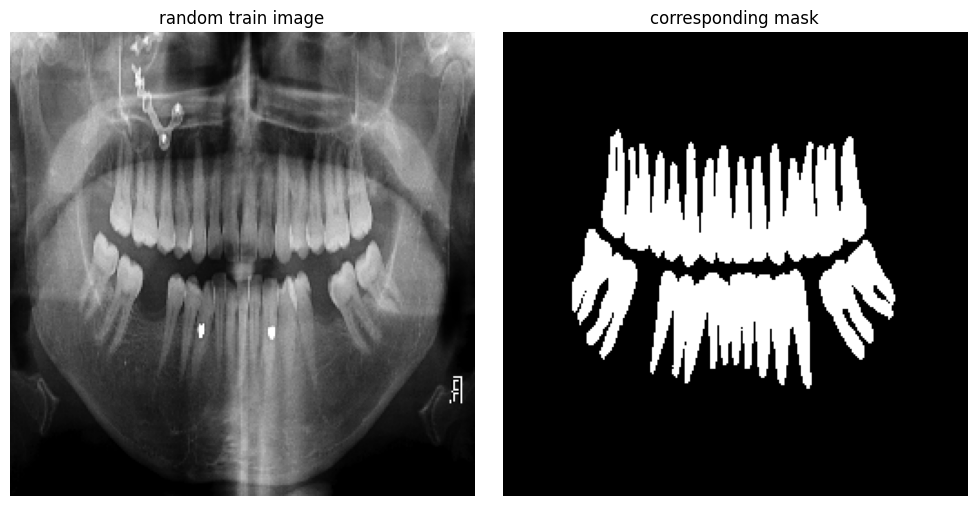

In [14]:
images = images_masks_batch[0]
masks = images_masks_batch[1]
random_index = np.random.randint(images.shape[0])
random_image = images[random_index]
random_mask = masks[random_index]
utils.display_images(random_image, random_mask, titles=['random train image', 'corresponding mask'])

In [15]:
images_batch = next(test_generator)

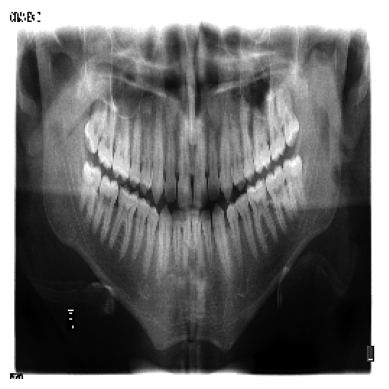

In [16]:
images = images_batch
random_index = np.random.randint(images.shape[0])
random_image = images[random_index]
utils.display_image(random_image)

# UNet Model For Segmenting Dental In Images

## Define

In [17]:
model = model_architecture.UNet(input_size=INPUT_SIZE+(1,))

In [18]:
utils.write_model_summary(model)

## Compile

### Specify the optimizer

In [19]:
optimizer = Adam(learning_rate=LEARNING_RATE)

### Define custom loss  
I decided to use a custom loss, using the addition of Binary Cross-Entropy (BCE) loss and Dice loss 

In [20]:
def dice_coefficient(y_true, y_pred):
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
    dice = (2.0 * intersection + 1e-7) / (union + 1e-7)
    return dice

def dice_loss(y_true, y_pred):
    dice = dice_coefficient(y_true, y_pred)
    dice_loss = 1.0 - dice
    return dice_loss

In [21]:
def custom_loss(y_true, y_pred):
    bce = binary_crossentropy(y_true, y_pred)
    d = dice_loss(y_true, y_pred)
    return bce + d

In [22]:
model.compile(optimizer=optimizer, loss=custom_loss, metrics=['accuracy'])

## Train

### Define callback

In [23]:
class Callback(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if logs.get('accuracy') >= 0.99 and logs.get('val_accuracy') >= 0.97:
            print("Reached desired accuracy. Stopping training...")
            self.model.stop_training = True

### Training the model

In [ ]:
history = model.fit(train_generator, steps_per_epoch=STEPS_PER_EPOCH, epochs=EPOCHS,
                    validation_data=val_generator, validation_steps=STEPS_PER_EPOCH, verbose=1, callbacks=[Callback()])

Epoch 1/200
13/13 [==============================] - 50s 2s/step - loss: 1.6332 - accuracy: 0.7489 - val_loss: 1.2934 - val_accuracy: 0.7736
Epoch 2/200
13/13 [==============================] - 19s 2s/step - loss: 1.2630 - accuracy: 0.7856 - val_loss: 1.1485 - val_accuracy: 0.7725
Epoch 3/200
13/13 [==============================] - 20s 2s/step - loss: 1.4088 - accuracy: 0.7950 - val_loss: 1.4039 - val_accuracy: 0.7741
Epoch 4/200
13/13 [==============================] - 20s 2s/step - loss: 1.2974 - accuracy: 0.6769 - val_loss: 1.2237 - val_accuracy: 0.7878
Epoch 5/200
13/13 [==============================] - 20s 2s/step - loss: 1.1757 - accuracy: 0.7716 - val_loss: 1.0566 - val_accuracy: 0.7754
Epoch 6/200
13/13 [==============================] - 20s 2s/step - loss: 1.1444 - accuracy: 0.7428 - val_loss: 1.0760 - val_accuracy: 0.7856
Epoch 7/200
13/13 [==============================] - 19s 2s/step - loss: 1.1302 - accuracy: 0.7458 - val_loss: 1.0208 - val_accuracy: 0.7713
Epoch 8/200
1

### Save weights

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
model.save('/content/drive/MyDrive/share/dental-segmentation/model_weights.h5')

## Load trained weights

In [24]:
!gdown 1-BE8LMnMgidZJ4RQECnoVJqQg2lJHoCv -O /content/model_weights.h5

Downloading...
From: https://drive.google.com/uc?id=1-BE8LMnMgidZJ4RQECnoVJqQg2lJHoCv
To: /content/model_weights.h5
100% 373M/373M [00:06<00:00, 54.3MB/s]


In [25]:
model.load_weights('/content/model_weights.h5')

# Image Processing For Segmenting Decays In Images

I developed 2 decay detection algorithms. One is a simple threshholding mechanism and the other is dynamic threshholding. 

## 1-Static Threshholding  
Because decays form the brightest pixels in dental area we can detect decays, applying a simple threshhold.
Before applying threshhold, I did a multiplication between image and dental masks we have(either from the dataset or predicted by my model), So only bright pixels in dental area are assessed. This multiplication is in a sense a masking, masking dental masks on images.
Then threshholding is applyed in order to segment any decays.

In [26]:
def detect_decays_static_th(images, dental_masks=None, threshhold=0.9):
    decay_masks = []
    
    for image, dental_mask in zip(images, dental_masks):
        decay_mask = np.zeros_like(dental_mask)
        image_masked_with_dental_mask  = image * dental_mask
        decay_mask[image_masked_with_dental_mask > threshhold] = 1
        decay_masks.append(decay_mask)

    decay_masks = np.array(decay_masks)
    return decay_masks

## 2- Dynamic Threshholding

I observed that sometimes decays does'nt fall in to the threshhold we set. Sometimes decays falls below the threshhold. If we lower the threshhold, since this threshhold is global and got applyed to all images, this would lead to detecting more non-decay pixels in many images. I designed an algorith so that each image would have It's own threshhold according to it's pixel values in dental area.

In [92]:
def detect_decays_dynamic_th(images, dental_masks=None, pixel_count_threshhold=50, range_threshhold=20):
    '''
    thresshold is the minimum histogram bin count of brightest pixel in the dental area
    '''
    decay_masks = []
    k = 1
    for image, dental_mask in zip(images, dental_masks):
        decay_mask = np.zeros_like(dental_mask)
        image_masked_with_dental_mask = image * dental_mask

        hist, edges = np.histogram(image_masked_with_dental_mask.flatten(), bins=256, range=[0, 1])

        # Finding the brightest value in the histogram
        bp_count = 0
        bp_index = 0
        for i in range(len(hist)-1, -1, -1):
            bin_start = edges[i]
            bin_end = edges[i+1]
            bin_count = hist[i]
            if bin_count > bp_count:
              bp_count = bin_count
              bp_index = i
              #print(f'image {k} bp_count: {bp_count}, bp_index: {bp_index}')
              break

        # case where count pixels of brightest value is not satisfied, then no decays are detected
        if bp_index != 0:
          # filtering brightest values less than pixel count threshhold. Brightest pixels with count less 
          #than threshhold are probably not decay
          decay_threshhold_dynamic = (bp_index - range_threshhold)/255

          if bp_count > pixel_count_threshhold:
              decay_mask[image_masked_with_dental_mask > decay_threshhold_dynamic] = 1

        decay_masks.append(decay_mask)
        k += 1
    decay_masks = np.array(decay_masks)
    return decay_masks

## Compare results

In [28]:
images_masks_batch = next(train_generator)

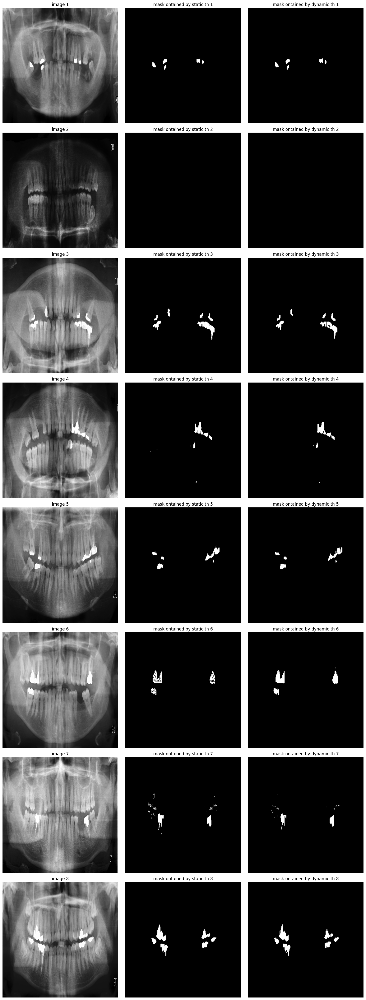

In [29]:
images = images_masks_batch[0]
masks = images_masks_batch[1]
decay_masks_s = detect_decays_static_th(images, masks)
decay_masks_d = detect_decays_dynamic_th(images, masks)
utils.display_image_sets(images, decay_masks_s, decay_masks_d,
                                      titles=['image','mask ontained by static th', 'mask ontained by dynamic th'])

# Improve Masks

In [30]:
def apply_morphological_opening(masks):
  improved_masks = []
  for mask in masks:
    kernel = np.ones((3, 3), dtype=np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel=kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel=kernel)
    mask = np.expand_dims(mask, axis=2)
    improved_masks.append(mask)
  improved_masks = np.array(improved_masks)
  return improved_masks

In [31]:
images_masks_batch = next(train_generator)

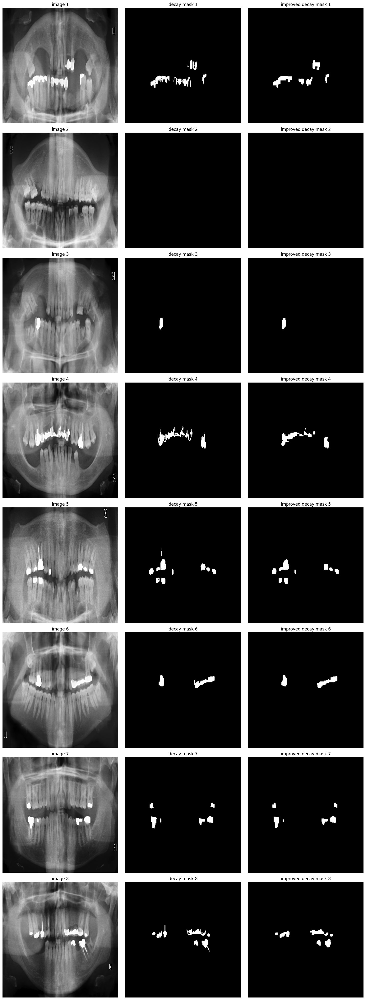

In [32]:
images = images_masks_batch[0]
masks = images_masks_batch[1]
decay_masks = detect_decays_dynamic_th(images, masks)
improved_masks = apply_morphological_opening(decay_masks)
utils.display_image_sets(images, decay_masks, improved_masks,titles=['image', 'decay mask','improved decay mask'])

# Combine Dental And Decay masks 

In the final mask, we will have 3 classes with the values as follows:  
- background -> 0
- teeth -> 1
- decay -> 2


In [33]:
def combine_masks(dental_masks, decay_masks):
    combined_masks = np.zeros_like(dental_masks)
    combined_masks[dental_masks == 1] = 1
    combined_masks[decay_masks == 1] = 2
    return combined_masks

In [34]:
images_masks_batch = next(train_generator)
images = images_masks_batch[0]
masks = images_masks_batch[1]
decay_masks = detect_decays_dynamic_th(images, masks)
improved_masks = apply_morphological_opening(decay_masks)
 
final_masks = combine_masks(masks, decay_masks)
np.unique(final_masks)

array([0., 1., 2.], dtype=float32)

Final masks will have only 3 values, namely 0, 1 and 2 for 3 clouses. In the following cell I wrote a function that can map this final mask to a rgb colored mask that can be visualized

In [35]:
def colorize_final_masks(final_masks, bg_color='black', teeth_color='white', decay_color='lightcoral'):
    colored_masks = []
    for mask in final_masks:
      colored_mask = np.zeros((mask.shape[0], mask.shape[1], 3))
      for i in range(mask.shape[0]):
          for j in range(mask.shape[1]):
              if(mask[i][j][0] == 0):
                  colored_mask[i][j] = colors.to_rgb(bg_color)
              elif(mask[i][j][0] == 1):
                  colored_mask[i][j] = colors.to_rgb(teeth_color)
              elif(mask[i][j][0] == 2):
                  colored_mask[i][j] = colors.to_rgb(decay_color)
            
      colored_masks.append(colored_mask)
    colored_masks = np.array(colored_masks)
    return colored_masks

In [36]:
images_masks_batch = next(train_generator)

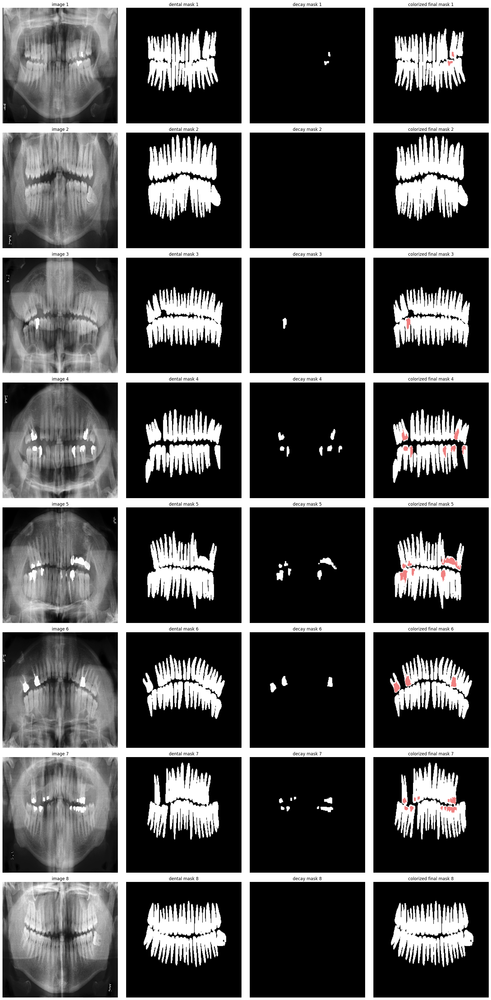

In [37]:
images = images_masks_batch[0]
masks = images_masks_batch[1]
decay_masks = detect_decays_dynamic_th(images, masks, range_threshhold=15)
improved_masks = apply_morphological_opening(decay_masks)
final_masks = combine_masks(masks, decay_masks)
colorized_final_masks = colorize_final_masks(final_masks)
utils.display_image_sets(images, masks, improved_masks, colorized_final_masks, titles=['image', 'dental mask', 'decay mask', 'colorized final mask']
              , cmaps=['gray', 'gray', 'gray', 'rgb'])


# Predict On Validation Data

In [52]:
images_masks_batch = next(val_generator)
images = images_masks_batch[0]
true_masks = images_masks_batch[1]
predicted_masks = model.predict(images)

1/1 [==============================] - 0s 27ms/step


In [54]:
# Threshold the predictions
threshold = 0.5
predicted_masks[predicted_masks >= threshold] = 1
predicted_masks[predicted_masks < threshold] = 0

Accuracy for image 1: 0.96356201171875
Accuracy for image 2: 0.972503662109375
Accuracy for image 3: 0.973114013671875
Accuracy for image 4: 0.96685791015625
Accuracy for image 5: 0.967926025390625
Accuracy for image 6: 1.0
Accuracy for image 7: 0.973968505859375
Accuracy for image 8: 0.979949951171875
Overall accuracy: 0.9747352600097656


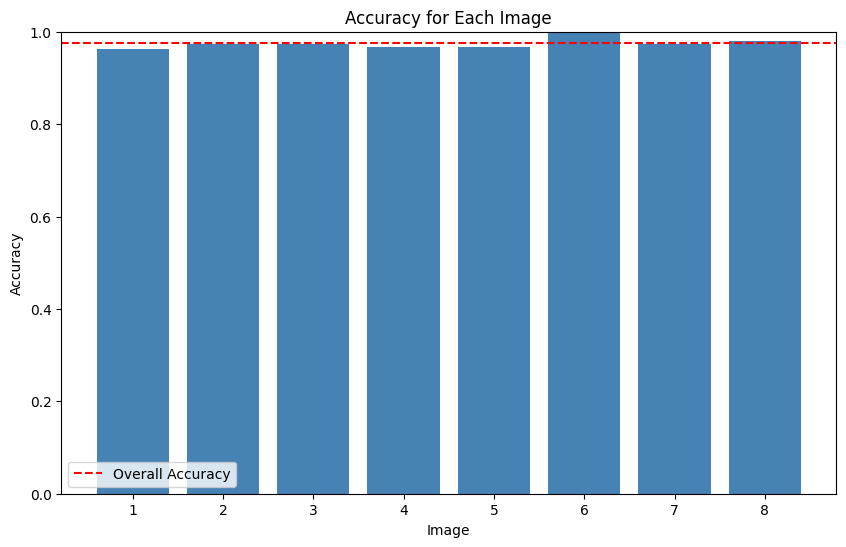

In [59]:
accuracies, overall_accuracy = utils.calculate_accuracies(true_masks, predicted_masks)
for i, accuracy in enumerate(accuracies):
    print(f"Accuracy for image {i+1}: {accuracy}")
print(f"Overall accuracy: {overall_accuracy}")
utils.plot_accuracies(accuracies, overall_accuracy)

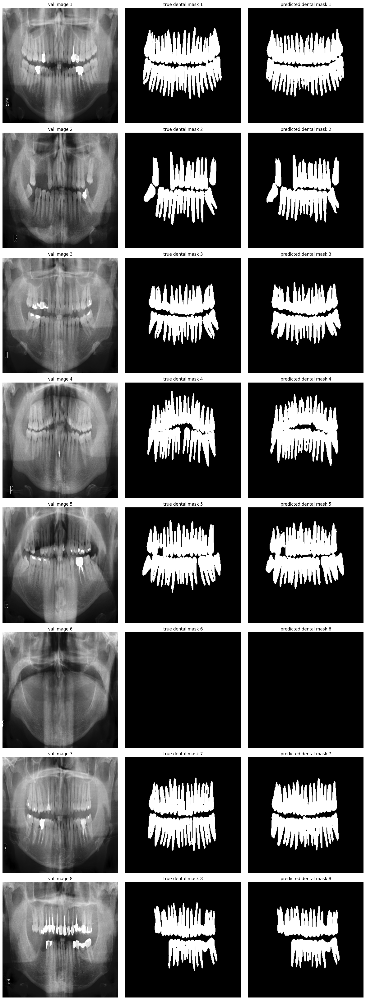

In [56]:
utils.display_image_sets(images, true_masks, predicted_masks,
                         titles=['val image', 'true dental mask', 'predicted dental mask'])

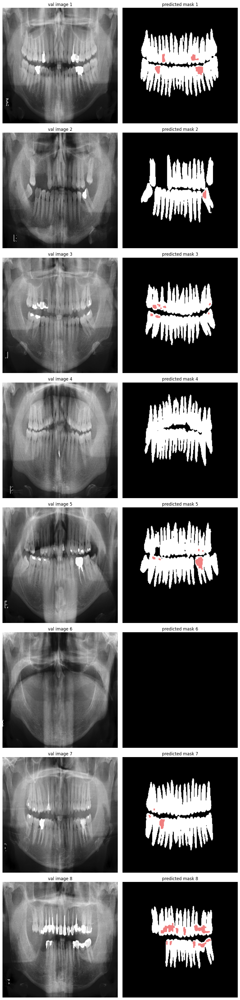

In [93]:
detected_decay_masks = detect_decays_dynamic_th(images, predicted_masks, pixel_count_threshhold=20, range_threshhold=15)
improved_decay_masks = apply_morphological_opening(detected_decay_masks)
final_pred_masks = combine_masks(predicted_masks, improved_decay_masks)
colorized_final_pred_masks = colorize_final_masks(final_pred_masks)
utils.display_image_sets(images, colorized_final_pred_masks,
                         titles=['val image', 'predicted mask']
              , cmaps=['gray', 'rgb'])

# Predict On Test Data

In [38]:
test_images = next(test_generator)
predicted_masks = model.predict(test_images)

1/1 [==============================] - 10s 10s/step


In [39]:
test_images = next(test_generator)
predicted_masks = model.predict(test_images)

# Threshold the predictions
threshold = 0.5
predicted_masks[predicted_masks >= threshold] = 1
predicted_masks[predicted_masks < threshold] = 0

1/1 [==============================] - 0s 21ms/step


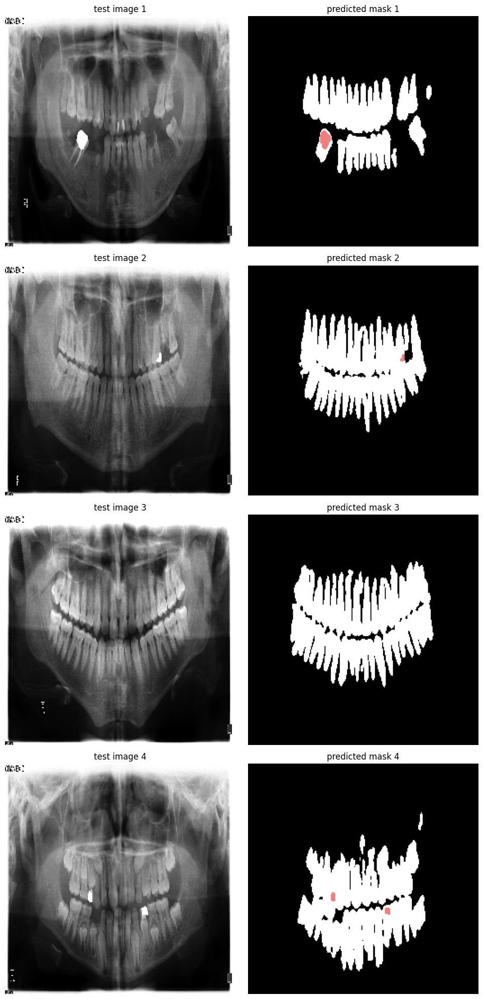

In [40]:
detected_decay_masks = detect_decays_dynamic_th(test_images, predicted_masks, pixel_count_threshhold=20, range_threshhold=15)
improved_decay_masks = apply_morphological_opening(detected_decay_masks)
final_pred_masks = combine_masks(predicted_masks, improved_decay_masks)
colorized_final_pred_masks = colorize_final_masks(final_pred_masks)
utils.display_image_sets(test_images, colorized_final_pred_masks,
                         titles=['test image', 'predicted mask']
              , cmaps=['gray', 'rgb'])